# Face Anonymization with UniFace

This notebook demonstrates face anonymization using various blur methods for privacy protection.

## 1. Install UniFace


In [1]:
%pip install -q uniface

# Clone repo for assets (Colab only)
import os
if 'COLAB_GPU' in os.environ or 'COLAB_RELEASE_TAG' in os.environ:
    if not os.path.exists('uniface'):
        !git clone --depth 1 https://github.com/yakhyo/uniface.git
    os.chdir('uniface/examples')

Note: you may need to restart the kernel to use updated packages.


## 2. Import Libraries


In [2]:
import cv2
import IPython.display as display
from PIL import Image
import numpy as np

import uniface
from uniface import RetinaFace
from uniface.privacy import BlurFace, anonymize_faces

print(f'UniFace version: {uniface.__version__}')

UniFace version: 2.0.0


## 3. Load Test Image

We'll use a test image to demonstrate face anonymization.


Image size: (624, 1024)


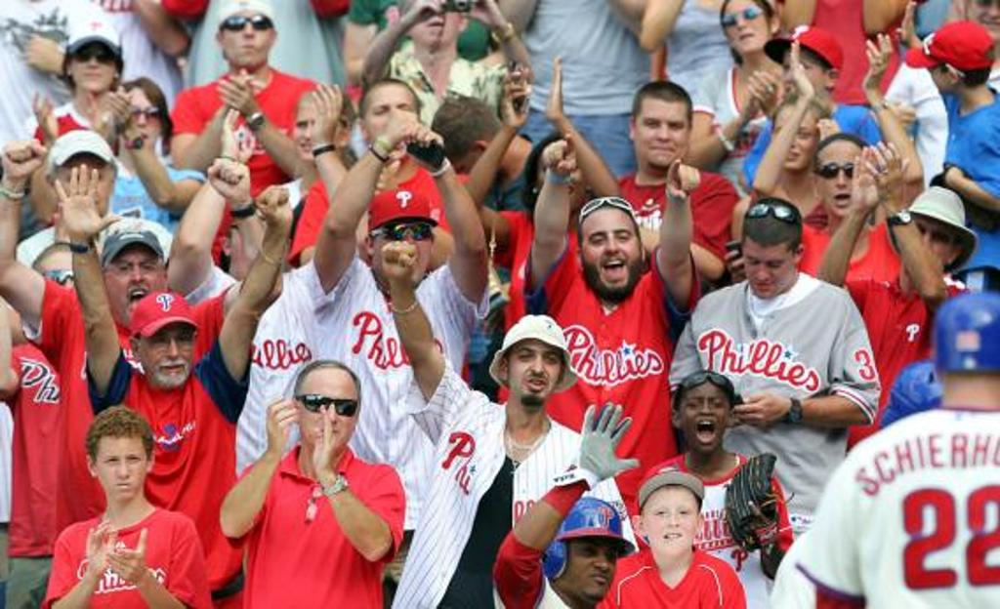

In [3]:
# Load image
image_path = '../assets/test.jpg'
image = cv2.imread(image_path)

# Display original image
pil_image = Image.open(image_path)
print(f'Image size: {image.shape[:2]}')
pil_image


## 4. Quick Start: One-Line Anonymization

The simplest way to anonymize faces is using the `anonymize_faces()` function.


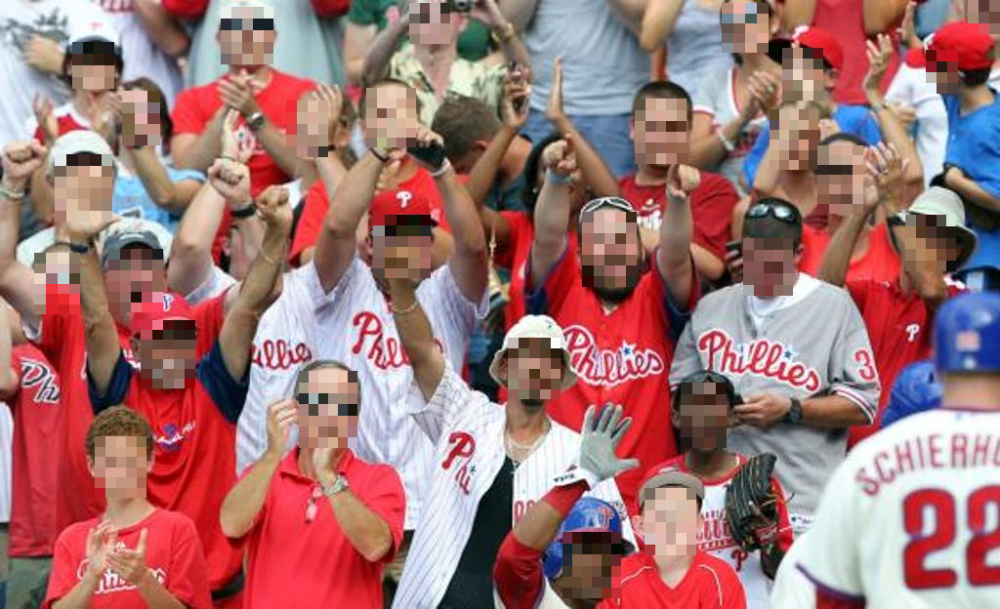

In [4]:
# One-line anonymization with automatic detection
anonymized = anonymize_faces(image.copy(), method='pixelate')

# Display result
output = cv2.cvtColor(anonymized, cv2.COLOR_BGR2RGB)
display.display(Image.fromarray(output))


## 5. Compare All Blur Methods

UniFace provides 5 different blur methods. Let's compare them:


Detected 27 faces
\nGAUSSIAN:


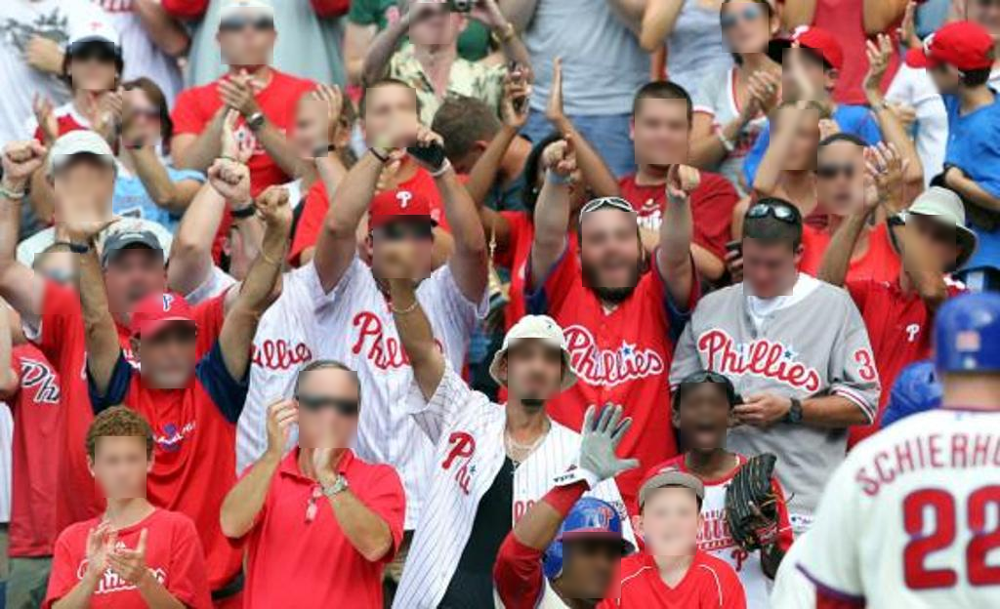

\nPIXELATE:


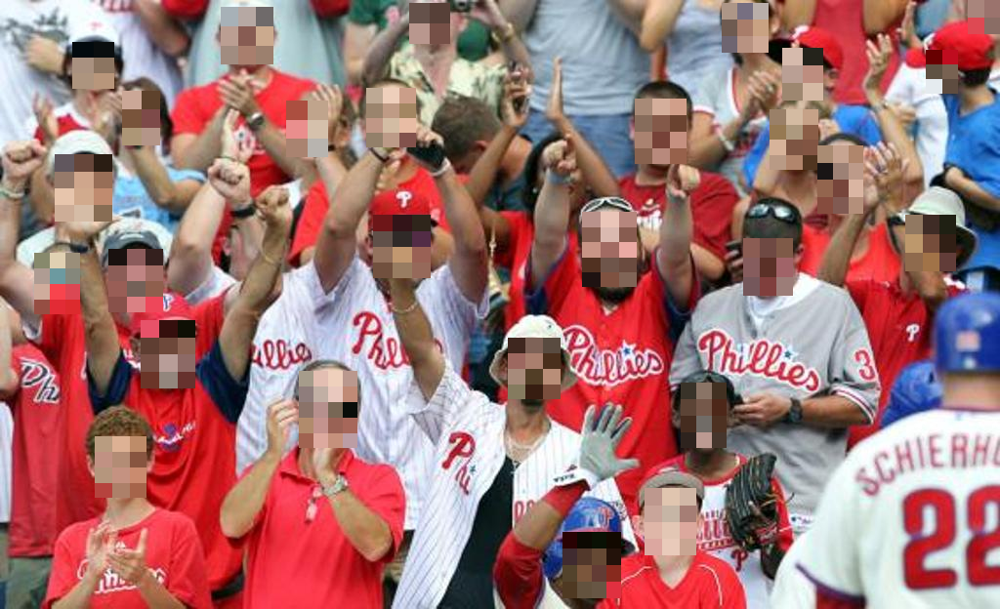

\nBLACKOUT:


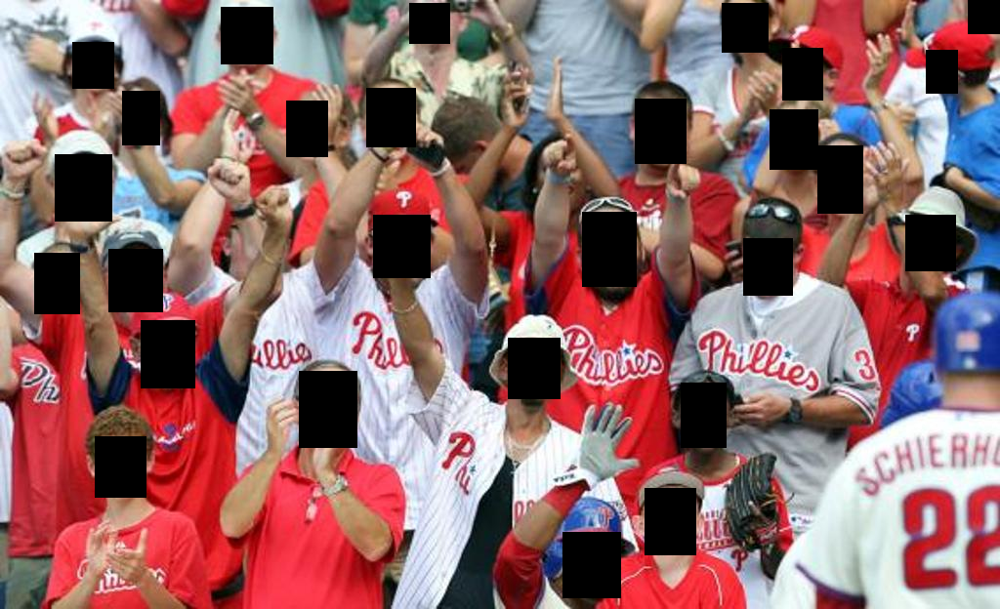

\nELLIPTICAL:


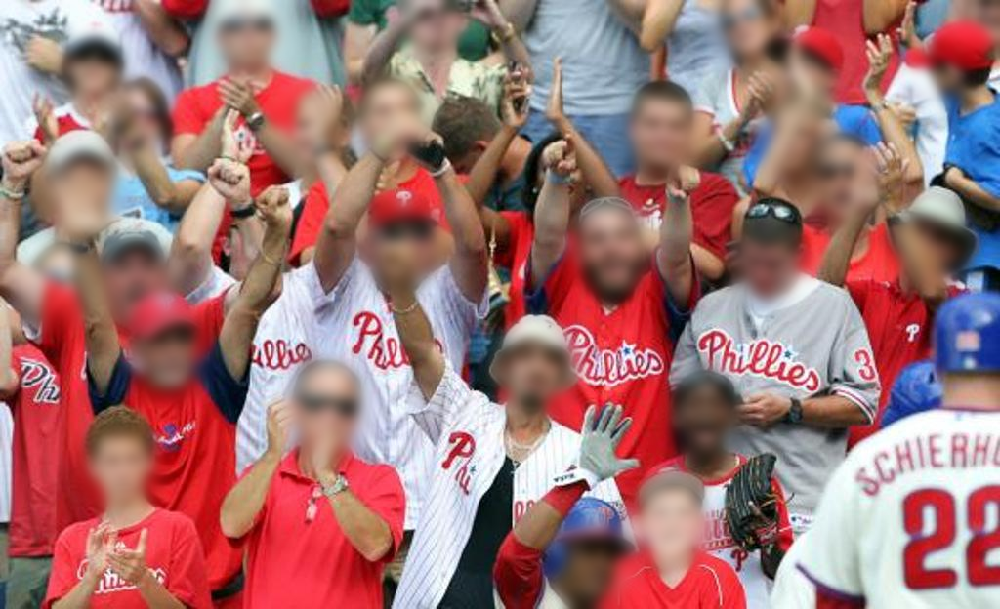

\nMEDIAN:


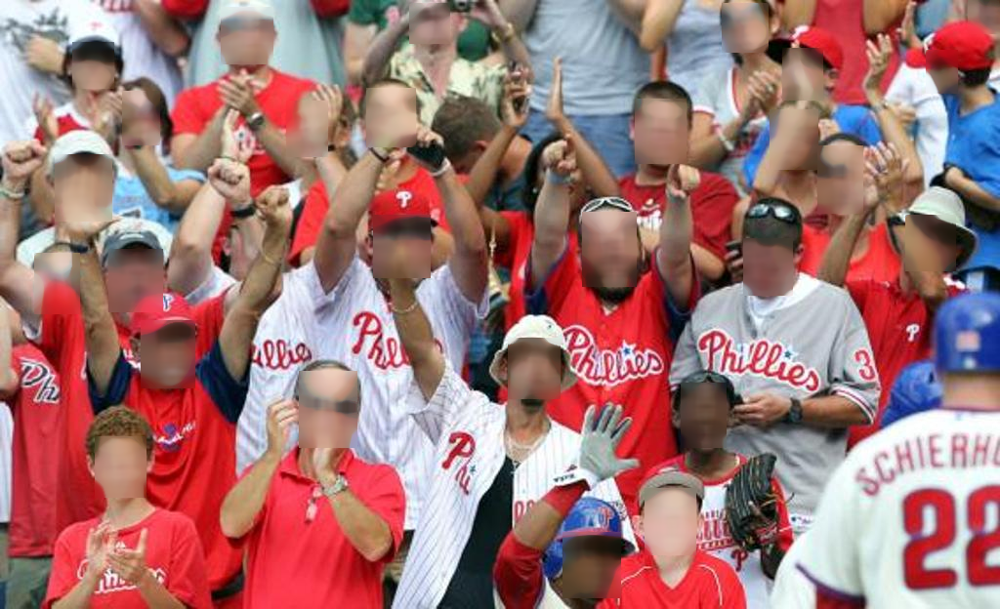

In [5]:
# Initialize detector
detector = RetinaFace(conf_thresh=0.5)
faces = detector.detect(image)
print(f'Detected {len(faces)} faces')

# Test all blur methods
methods = ['gaussian', 'pixelate', 'blackout', 'elliptical', 'median']

for method in methods:
    blurrer = BlurFace(method=method)
    anonymized = blurrer.anonymize(image.copy(), faces)

    output = cv2.cvtColor(anonymized, cv2.COLOR_BGR2RGB)
    print(f'\\n{method.upper()}:')
    display.display(Image.fromarray(output))


## 6. Summary

This notebook demonstrated:

- ✅ One-line face anonymization with `anonymize_faces()`
- ✅ Five different blur methods (gaussian, pixelate, blackout, elliptical, median)
- ✅ Automatic face detection and blurring

### Recommended Methods

| Use Case | Method | Parameters |
|----------|--------|------------|
| News media / Publishing | `pixelate` | `pixel_blocks=8-10` |
| Social media | `gaussian` or `elliptical` | `blur_strength=3-5` |
| Maximum privacy | `blackout` | `color=(0,0,0)` |
| Natural appearance | `elliptical` | `blur_strength=3, margin=20` |

### Further Resources

- [UniFace Documentation](https://github.com/yakhyo/uniface)
- [Other Examples](https://github.com/yakhyo/uniface/tree/main/examples)
